In [10]:
import numpy as np
import cv2 as cv

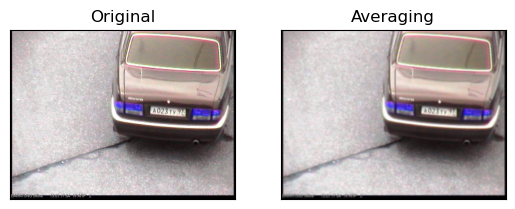

In [11]:
from matplotlib import pyplot as plt
img = cv.imread('Datasets/train/A023TY97.jpg')
assert img is not None, "file could not be read, check with os.path.exists()"
kernel = np.ones((5,5),np.float32)/25
dst = cv.filter2D(img,-1,kernel)
plt.subplot(121),plt.imshow(img),plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(dst),plt.title('Averaging')
plt.xticks([]), plt.yticks([])
plt.show()

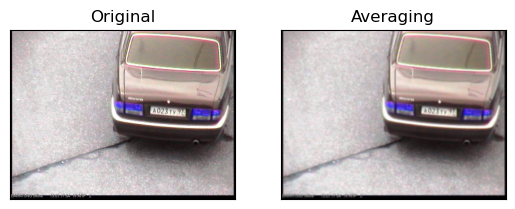

In [12]:
img = cv.imread('Datasets/train/A023TY97.jpg')
assert img is not None, "file could not be read, check with os.path.exists()"
kernel = np.ones((5,5),np.float32)/25
dst = cv.filter2D(img,-1,kernel)
plt.subplot(121),plt.imshow(img),plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(dst),plt.title('Averaging')
plt.xticks([]), plt.yticks([])
plt.show()


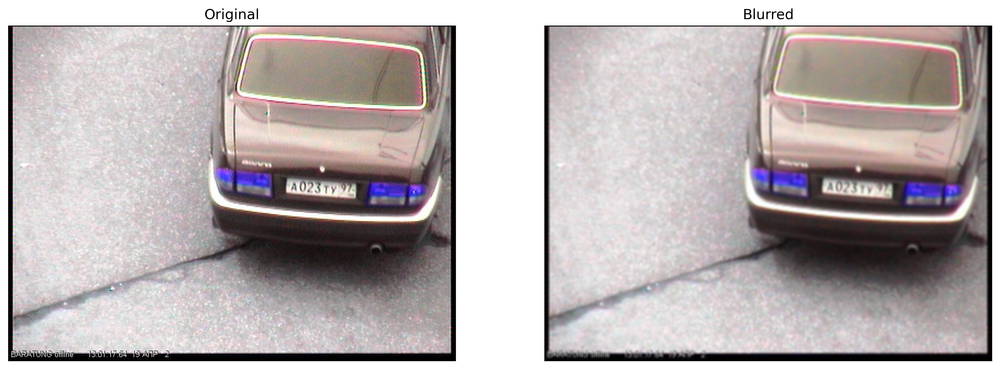

In [13]:
img = cv.imread('Datasets/train/A023TY97.jpg')
assert img is not None, "file could not be read, check with os.path.exists()"
blur = cv.blur(img,(5,5))
fig = plt.figure(figsize=(15, 7), dpi=300)
plt.subplot(121),plt.imshow(img),plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(blur),plt.title('Blurred')
plt.xticks([]), plt.yticks([])
plt.show()

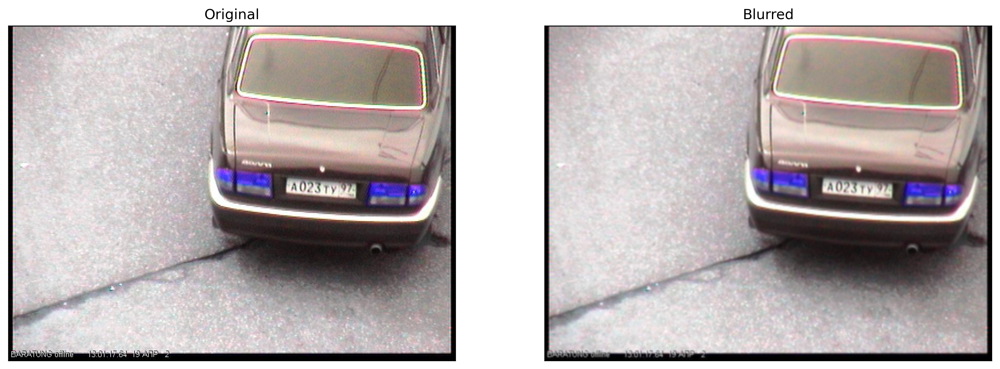

In [14]:
img = cv.imread('Datasets/train/A023TY97.jpg')
assert img is not None, "file could not be read, check with os.path.exists()"
blur = cv.GaussianBlur(img,(5,5),0)
fig = plt.figure(figsize=(15, 7), dpi=300)
plt.subplot(121),plt.imshow(img),plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(blur),plt.title('Blurred')
plt.xticks([]), plt.yticks([])
plt.show()

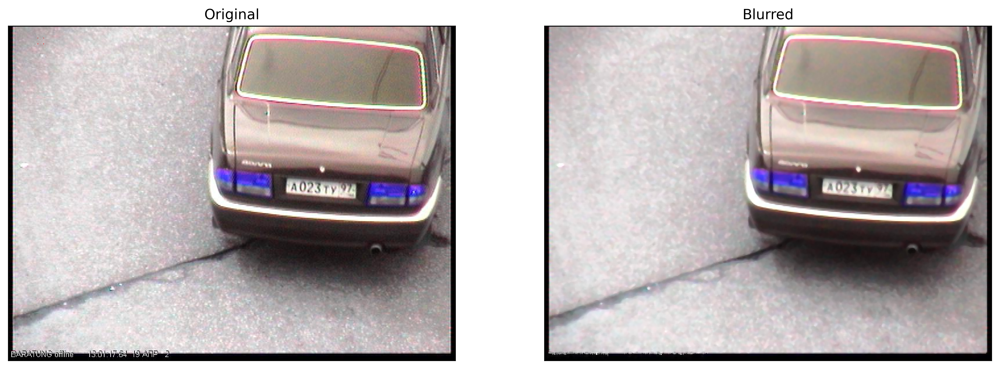

In [15]:
img = cv.imread('Datasets/train/A023TY97.jpg')
assert img is not None, "file could not be read, check with os.path.exists()"
median = cv.medianBlur(img,5)
img[20, 50] = [255, 0, 0]
img[20, 60] = [255, 0, 0]
img[30, 60] = [255, 0, 0]
img[30, 50] = [255, 0, 0]
fig = plt.figure(figsize=(15, 7), dpi=500)
plt.subplot(121),plt.imshow(img),plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(median),plt.title('Blurred')
plt.xticks([]), plt.yticks([])
plt.show()

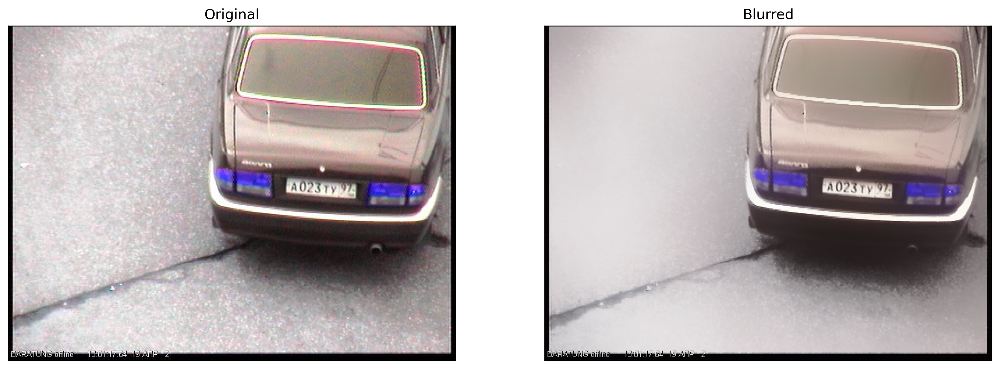

In [16]:
img = cv.imread('Datasets/train/A023TY97.jpg')
assert img is not None, "file could not be read, check with os.path.exists()"
blur = cv.bilateralFilter(img,100,75,75)
fig = plt.figure(figsize=(15, 7), dpi=300)
plt.subplot(121),plt.imshow(img),plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(blur),plt.title('Blurred')
plt.xticks([]), plt.yticks([])
plt.show()

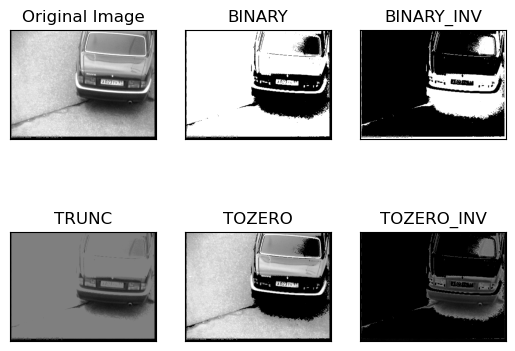

In [17]:
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt
img = cv.imread('Datasets/train/A023TY97.jpg', cv.IMREAD_GRAYSCALE)
assert img is not None, "file could not be read, check with os.path.exists()"
ret,thresh1 = cv.threshold(img,127,255,cv.THRESH_BINARY)
ret,thresh2 = cv.threshold(img,127,255,cv.THRESH_BINARY_INV)
ret,thresh3 = cv.threshold(img,127,255,cv.THRESH_TRUNC)
ret,thresh4 = cv.threshold(img,127,255,cv.THRESH_TOZERO)
ret,thresh5 = cv.threshold(img,127,255,cv.THRESH_TOZERO_INV)
titles = ['Original Image','BINARY','BINARY_INV','TRUNC','TOZERO','TOZERO_INV']
images = [img, thresh1, thresh2, thresh3, thresh4, thresh5]
for i in range(6):
    plt.subplot(2,3,i+1),plt.imshow(images[i],'gray',vmin=0,vmax=255)
    plt.title(titles[i])
    plt.xticks([]),plt.yticks([])
plt.show()

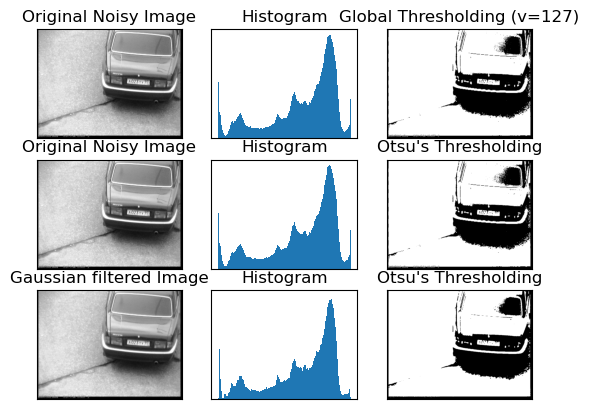

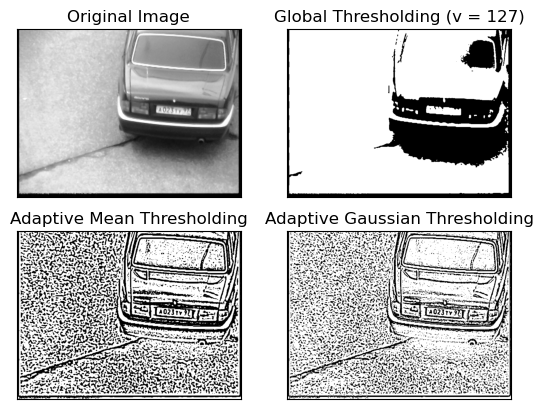

In [18]:
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt
img = cv.imread('Datasets/train/A023TY97.jpg', cv.IMREAD_GRAYSCALE)
assert img is not None, "file could not be read, check with os.path.exists()"
# global thresholding
ret1,th1 = cv.threshold(img,127,255,cv.THRESH_BINARY)
# Otsu's thresholding
ret2,th2 = cv.threshold(img,0,255,cv.THRESH_BINARY+cv.THRESH_OTSU)
# Otsu's thresholding after Gaussian filtering
blur = cv.GaussianBlur(img,(5,5),0)
ret3,th3 = cv.threshold(blur,0,255,cv.THRESH_BINARY+cv.THRESH_OTSU)
# plot all the images and their histograms
images = [img, 0, th1,
          img, 0, th2,
          blur, 0, th3]
titles = ['Original Noisy Image','Histogram','Global Thresholding (v=127)',
          'Original Noisy Image','Histogram',"Otsu's Thresholding",
          'Gaussian filtered Image','Histogram',"Otsu's Thresholding"]
for i in range(3):
    plt.subplot(3,3,i*3+1),plt.imshow(images[i*3],'gray')
    plt.title(titles[i*3]), plt.xticks([]), plt.yticks([])
    plt.subplot(3,3,i*3+2),plt.hist(images[i*3].ravel(),256)
    plt.title(titles[i*3+1]), plt.xticks([]), plt.yticks([])
    plt.subplot(3,3,i*3+3),plt.imshow(images[i*3+2],'gray')
    plt.title(titles[i*3+2]), plt.xticks([]), plt.yticks([])
plt.show()
img = cv.imread('Datasets/train/A023TY97.jpg', cv.IMREAD_GRAYSCALE)
assert img is not None, "file could not be read, check with os.path.exists()"
img = cv.medianBlur(img,5)
ret,th1 = cv.threshold(img,127,255,cv.THRESH_BINARY)
th2 = cv.adaptiveThreshold(img,255,cv.ADAPTIVE_THRESH_MEAN_C, \
                           cv.THRESH_BINARY,11,2)
th3 = cv.adaptiveThreshold(img,255,cv.ADAPTIVE_THRESH_GAUSSIAN_C, \
                           cv.THRESH_BINARY,11,2)
titles = ['Original Image', 'Global Thresholding (v = 127)',
          'Adaptive Mean Thresholding', 'Adaptive Gaussian Thresholding']
images = [img, th1, th2, th3]
for i in range(4):
    plt.subplot(2,2,i+1),plt.imshow(images[i],'gray')
    plt.title(titles[i])
    plt.xticks([]),plt.yticks([])
plt.show()

In [19]:
im = cv.imread('Datasets/train/A023TY97.jpg')
assert im is not None, "file could not be read, check with os.path.exists()"
imgray = cv.cvtColor(im, cv.COLOR_BGR2GRAY)
edged = cv.Canny(imgray, 30, 200)

contours, hierarchy = cv.findContours(edged,cv.RETR_EXTERNAL, cv.CHAIN_APPROX_NONE)

#ret, thresh = cv.threshold(imgray, 127, 255, 0)
#contours, im2 = cv.findContours(thresh, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)

In [20]:
img = cv.imread('Datasets/train/A023TY97.jpg')
cv.drawContours(im, contours, -1, (0,255,0), 3)

cv.imshow("Original Image", im)
k = cv.waitKey(0)

In [21]:
cv.drawContours(img, contours, 3, (0,255,0), 3)
cv.imshow("Original Image", im)
k = cv.waitKey(0)

In [22]:
cnt = contours[4]
cv.drawContours(im, [cnt], 0, (0,255,0), 3)
cv.imshow("Original Image", im)
k = cv.waitKey(0)